In [1]:
# Load data into Python
import math
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn
import csv

pricedata = pd.read_excel('Commodity Data.xlsx',sheetname='Return indices',index_col=0)
# transfer return indexes to return data
returndata=pricedata.pct_change(periods=1)
# log scale return
logreturn=np.log(1 + returndata)
# report other discriptive data
sum_table=logreturn.describe()
print(sum_table)
# report first oberservation of return data
first_valid_date = returndata.apply(lambda series: series.first_valid_index())
print(first_valid_date)
valid_date_table=(first_valid_date.to_frame(name="First oberservation date")).T
result = sum_table.append(valid_date_table)
writer = pd.ExcelWriter('dataouput.xlsx')
result.to_excel(writer,'summary table')
writer.save()

              Wheat  Feeder Cattle  Kansas wheat   Live Cattle       Coffee  \
count  11218.000000    2865.000000   3646.000000  11218.000000  8343.000000   
mean      -0.000145       0.000049     -0.000168      0.000114    -0.000196   
std        0.016241       0.008958      0.017596      0.010077     0.021669   
min       -0.099728      -0.059970     -0.089948     -0.063574    -0.141958   
25%       -0.009193      -0.005045     -0.010292     -0.005260    -0.010630   
50%        0.000000       0.000000      0.000000      0.000000     0.000000   
75%        0.008534       0.005272      0.009563      0.005731     0.010194   
max        0.087943       0.033551      0.080977      0.041707     0.232313   

            Cotton      Soybeans         Sugar        Cocoa          Corn  \
count  9386.000000  11218.000000  10430.000000  7561.000000  11218.000000   
mean     -0.000090      0.000129     -0.000132    -0.000322     -0.000152   
std       0.014471      0.014864      0.023812     0.0183

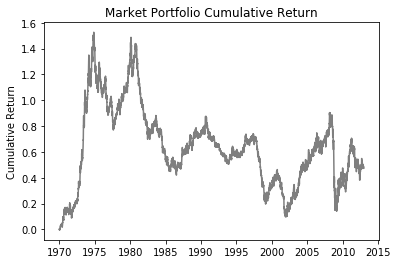

In [2]:
# log return 
# form commodity market factor 
n=len(pricedata.columns)
# The first date with all commodity data available
startdate=first_valid_date.sort_values()[-1]

# form market portfolio 
mktportfolio=logreturn.mean(axis=1)
Mkt_cum_ret = mktportfolio.cumsum()
plt.plot(Mkt_cum_ret, color='C7')
plt.title('Market Portfolio Cumulative Return')
plt.ylabel('Cumulative Return')
plt.show()

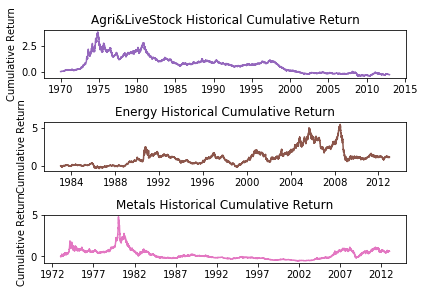

In [3]:
# Contribution of each commodity sectors
# First calculate avg log returns for each commodity
# and combine columns by sector
logreturn['Agri&LiveStock'] = logreturn.iloc[:, 0:11].mean(1)
logreturn['Energy'] = logreturn.iloc[:, 11:17].mean(1)
logreturn['Metals'] = logreturn.iloc[:, 17:24].mean(1)

# Calculate cumulative performance of each sector
Agri_benchmark = np.exp(logreturn['Agri&LiveStock'].cumsum())-1
Energy_benchmark = np.exp(logreturn['Energy'].cumsum())-1
Metals_benchmark = np.exp(logreturn['Metals'].cumsum())-1

# Visualisation of the respective portfolios
plt.subplot(3, 1, 1)
plt.plot(Agri_benchmark, color='C4')
plt.title('Agri&LiveStock Historical Cumulative Return')
plt.ylabel('Cumulative Return')

plt.subplot(3, 1, 2)
plt.plot(Energy_benchmark, color='C5')
plt.title('Energy Historical Cumulative Return')
plt.ylabel('Cumulative Return')

plt.subplot(3, 1, 3)
plt.plot(Metals_benchmark, color='C6')
plt.title('Metals Historical Cumulative Return')
plt.ylabel('Cumulative Return')

plt.tight_layout()
plt.show()

C:\Users\Iris\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in sign
  """


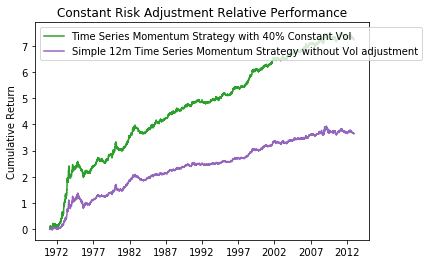

In [4]:
# MOP Model : Moskowitz, Ooi, Pedersen momentum paper
# TSMOM with constant risk portfolio as in original paper, and used as a benchmark to see 
# Whether composite strategy outperforms. 
lag=261
TSMOM_sign=np.sign(logreturn.rolling(lag).sum())
TSMOM_signal=TSMOM_sign.shift(periods=1, freq=None, axis=0)
# Calculate simple TSMOM portfolio return, go long 1 unit of each asset with positive trend and short 1 unit with negative one.
CNreturn=TSMOM_signal.multiply(logreturn, level=None, fill_value=None)
# Calculate TSMOM with costant volatility strategy return(scaled TSMOM portfolio)
vol=(logreturn.rolling(lag).std())*math.sqrt(lag)
return_vol=0.4/(vol.shift(periods=1, freq=None, axis=0))
CVreturn=CNreturn.multiply(return_vol)
CV_Port_return=CVreturn.mean(axis=1)
CV_cum_ret = CV_Port_return.cumsum()

# Without the constant vol adjustment
TSMOM_simple=CNreturn.mean(axis=1)
TSMOM_simple_cum=TSMOM_simple.cumsum()

plt.plot(CV_cum_ret, color='C2', label = 'Time Series Momentum Strategy with 40% Constant Vol')
plt.plot(TSMOM_simple_cum, color='C4', label = 'Simple 12m Time Series Momentum Strategy without Vol adjustment')
plt.title('Constant Risk Adjustment Relative Performance')
plt.ylabel('Cumulative Return')
plt.legend(loc='upper left')

plt.show()

In [5]:
# MOP signal - To reduce the cost of misclassification of a signal, I have separated the signal into +1/0/-1
# If sum of past 12 month log return greater than 10% of the vol of the previous 2 year return, signal is
#  +-1, otherwise signal is 0 i.e. the signal is less strong
lag=261
pastvol=(logreturn.rolling(lag*2).std())*math.sqrt(lag)
past_vol=pastvol.shift(periods=1, freq=None, axis=0)
MOP_sign=logreturn.rolling(lag).sum()
# shift signals so that they are traded one time period in the future
MOP_sign=MOP_sign.shift(periods=1, freq=None, axis=0)

MOP_sign[MOP_sign>(0.1*past_vol)]=1
MOP_sign[MOP_sign<(0.1*past_vol)]=-1
MOP_sign[np.absolute(MOP_sign)!=1]=0

#Increase print out display to help check accuracy of process
pd.set_option('display.max_rows', 3000)

#MOP_sign
MOP_sign

,Wheat,Feeder Cattle,Kansas wheat,Live Cattle,Coffee,Cotton,Soybeans,Sugar,Cocoa,Corn,...,Silver,Gold,LME Nickel,LME Lead,LME Copper,LME Zinc,LME Aluminum,Agri&LiveStock,Energy,Metals
date,,,,,,,,,,,,,,,,,,,,,
1969-12-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1970-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1970-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1970-01-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1970-01-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1970-01-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1970-01-08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1970-01-09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1970-01-12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


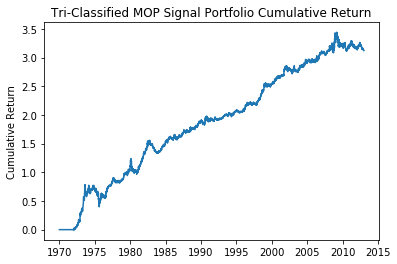

In [6]:
# Calculate the cumulative return of the time series momentum strategy, incorporating a trinomial classification
MOP_return=MOP_sign.multiply(logreturn, level=None, fill_value=None)
MOP_Port_return=MOP_return.mean(axis=1)
MOP_cum_ret = MOP_Port_return.cumsum()

plt.plot(MOP_cum_ret)
plt.title('Tri-Classified MOP Signal Portfolio Cumulative Return')
plt.ylabel('Cumulative Return')
plt.show()


In [7]:
# Moving Average Crossover signal

ShortNperiods= 120 #Six months
LongNperiods= 522 #2 years

ShortTermMA = returndata.rolling(ShortNperiods).mean()
LongTermMA = returndata.rolling(LongNperiods).mean()
signalsMA_unshift=returndata.copy() 
signalsMA_unshift[ShortTermMA>LongTermMA]=1
signalsMA_unshift[ShortTermMA<LongTermMA]=-1
signalsMA_unshift[np.absolute(signalsMA_unshift)!=1]=0


# Shift signal to be applied to next trading period fo
signalsMA=signalsMA_unshift.shift(periods=1, freq=None, axis=0)

signalsMA

,Wheat,Feeder Cattle,Kansas wheat,Live Cattle,Coffee,Cotton,Soybeans,Sugar,Cocoa,Corn,...,Brent crude,WTI,Gas oil,Silver,Gold,LME Nickel,LME Lead,LME Copper,LME Zinc,LME Aluminum
date,,,,,,,,,,,,,,,,,,,,,
1969-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1970-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1970-01-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1970-01-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1970-01-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1970-01-08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1970-01-09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1970-01-12,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


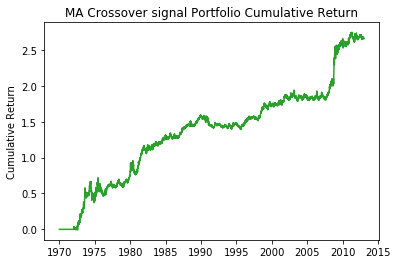

In [8]:
# MA Crossover signal portfolio performance
signalsMA_return=signalsMA.multiply(logreturn, level=None, fill_value=None)
signalsMA_port_return=signalsMA_return.mean(axis=1)
signalsMA_cum_ret = signalsMA_port_return.cumsum()

plt.plot(signalsMA_cum_ret, color='C2')
plt.title('MA Crossover signal Portfolio Cumulative Return')
plt.ylabel('Cumulative Return')
plt.show()

In [9]:
# Breakout signal
# Use a 55 day breakout signal
N = 55
pricedata = pd.read_excel('Commodity Data.xlsx',sheetname='Return indices',index_col=0)
stock_high_unshift = pricedata.rolling(N).max()
stock_low_unshift = pricedata.rolling(N).min()
stock_avg_unshift = pricedata.rolling(N).mean()
#rolling max/min/ave of previous prices is shifted down to compare with price on the following day
stock_high=stock_high_unshift.shift(periods=1, freq=None, axis=0)
stock_low=stock_low_unshift.shift(periods=1, freq=None, axis=0)
stock_avg=stock_avg_unshift.shift(periods=1, freq=None, axis=0)

Breakout_long=pricedata.iloc[N:].copy()
Breakout_short=pricedata.iloc[N:].copy()
# Long entry, if above average but below higest level, set to 0.5
Breakout_long[Breakout_long<stock_avg[N:]]=0
Breakout_long[Breakout_long>stock_high[N:]]=1
Breakout_long[Breakout_long>1]=0.5
# Short entry, if below average but above lowest level, set to -0.5
Breakout_short[Breakout_short<stock_low[N:]]=-1
Breakout_short[Breakout_short>stock_avg[N:]]=0
Breakout_short[Breakout_short>0]=-0.5
# To identiy "Long Exit" Signal, exit long position when the signal changes from 1 to 0
# Rolling window(2) it just a way to identy whether long entry signal already valid
# Set loop frequency to 55; large enough to identify all continuing signals
for i in range(0,N): 
    Breakout_long_sum=Breakout_long.rolling(2).sum()
    #If previou signal is 1 and present one is 0.5, present signal changes to 1
    Breakout_long[Breakout_long_sum==1.5]=1
    Breakout_short_sum=Breakout_short.rolling(2).sum()
    Breakout_short[Breakout_short_sum==-1.5]=-1
# Combine two signals into Breakout signals
Breakout_signal=Breakout_long+Breakout_short
Breakout_signal[np.absolute(Breakout_signal)==0.5]=0

# Shift signal to be applied to next trading period when implemented
Breakout_signal=Breakout_signal.shift(periods=1, freq=None, axis=0)

Breakout_signal


,Wheat,Feeder Cattle,Kansas wheat,Live Cattle,Coffee,Cotton,Soybeans,Sugar,Cocoa,Corn,...,Brent crude,WTI,Gas oil,Silver,Gold,LME Nickel,LME Lead,LME Copper,LME Zinc,LME Aluminum
date,,,,,,,,,,,,,,,,,,,,,
1970-03-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-03-19,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-03-20,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-03-23,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-03-24,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-03-25,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-03-26,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-03-27,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-03-30,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


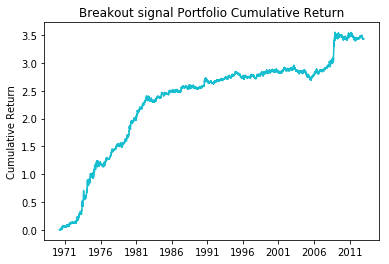

In [10]:
# Breakout signal portfolio performance
Breakout_return=Breakout_signal.multiply(logreturn, level=None, fill_value=None)
Breakout_port_return=Breakout_return.mean(axis=1)
Breakout_cum_ret = Breakout_port_return.cumsum()

plt.plot(Breakout_cum_ret, color='C9')
plt.title('Breakout signal Portfolio Cumulative Return')
plt.ylabel('Cumulative Return')
plt.show()

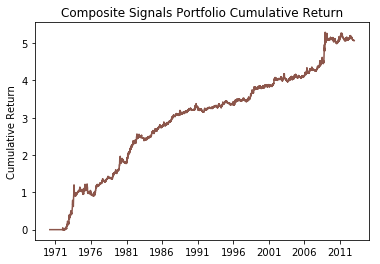

In [11]:
# Combine three signals
sum_signal=MOP_sign+signalsMA+Breakout_signal
combined_signal=sum_signal.copy()
# If at least two signals show 1/-1, follow the signal
combined_signal[sum_signal==2]=1
combined_signal[sum_signal==-2]=-1
# If all three signals show 1/-1, double the trading position
combined_signal[sum_signal==3]=2
combined_signal[sum_signal==-3]=-2
combined_signal[np.absolute(sum_signal)==1]=0
combined_return=combined_signal.multiply(logreturn, level=None, fill_value=None)
combined_port_ret=combined_return.mean(axis=1)
combined_cum_ret=combined_port_ret.cumsum()

plt.plot(combined_cum_ret, color='C5')
plt.title('Composite Signals Portfolio Cumulative Return')
plt.ylabel('Cumulative Return')
plt.show()

In [12]:
combined_signal

,Agri&LiveStock,Brent crude,Cocoa,Coffee,Corn,Cotton,Energy,Feeder Cattle,Gas oil,Gasoline,...,LME Zinc,Lean hogs,Live Cattle,Metals,Natural gas,Silver,Soybeans,Sugar,WTI,Wheat
date,,,,,,,,,,,,,,,,,,,,,
1969-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1970-01-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


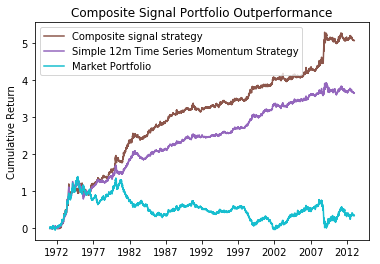

In [13]:
# Comparing it to the TSMOM paper strat
# i.e +-1 for pos/neg historical performance
# And compared to the market portfolio

# TSMOM portfolio return (without the constanst vol adjustment)
TSMOM_Port_return=CNreturn.mean(axis=1)
TSMOM_cum_ret_adj=TSMOM_Port_return.iloc[261:]
TSMOM_cum_ret_adj=TSMOM_cum_ret_adj.cumsum()

# As above align portfolio performance to be compared after 1 year of data, for parity, given lag to 
# establish Timeseries momentum signals

mktportfolio_adj=mktportfolio.iloc[261:]
Mkt_cum_ret_adj = mktportfolio_adj.cumsum()

combined_port_ret_adj=combined_port_ret.iloc[261:]
combined_cum_ret_adj = combined_port_ret_adj.cumsum()

# Composite signal outperformance visualisation

plt.plot(combined_cum_ret_adj, color='C5', label = 'Composite signal strategy')
plt.plot(TSMOM_cum_ret_adj, color='C4', label = 'Simple 12m Time Series Momentum Strategy')
plt.plot(Mkt_cum_ret_adj, color='C9', label = 'Market Portfolio')
plt.title('Composite Signal Portfolio Outperformance')
plt.ylabel('Cumulative Return')
plt.legend(loc='upper left')

plt.show()

In [14]:
# Run regression of returns for each strategy on market return
#Linear Regression of market return on returns of the trading strategies
from pandas.core import datetools
import statsmodels.api as sm 
import statsmodels.formula.api as smf

#Run regression and Calculate beta for Time Series Momentum Strategy with 40% Constant Volatility
CV_Port_Trade = CV_Port_return[lag+1:11219].values
CV_MOP_reg = smf.ols(formula = 'mktportfolio[lag+1:11219].values~ CV_Port_Trade',data=mktportfolio).fit()
print(CV_MOP_reg.summary())


C:\Users\Iris\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  This is separate from the ipykernel package so we can avoid doing imports until


                                    OLS Regression Results                                    
Dep. Variable:     mktportfolio[lag + 1:11219].values   R-squared:                       0.024
Model:                                            OLS   Adj. R-squared:                  0.024
Method:                                 Least Squares   F-statistic:                     273.1
Date:                                Mon, 28 May 2018   Prob (F-statistic):           1.26e-60
Time:                                        14:41:48   Log-Likelihood:                 36513.
No. Observations:                               10957   AIC:                        -7.302e+04
Df Residuals:                                   10955   BIC:                        -7.301e+04
Df Model:                                           1                                         
Covariance Type:                            nonrobust                                         
                    coef    std err          t    

In [15]:
#  Use 2-year lag to run regression of return for Tri_classification strategy on Market Return 
# and Calculate beta for Tri-classification Momentum Strategy 

MOP_Tri_classification_Trade = MOP_Port_return[lag*2+1:11219].values
MOP_Tri_classification_reg = smf.ols(formula = 'mktportfolio[lag*2+1:11219].values~ MOP_Tri_classification_Trade ',data=mktportfolio).fit()
print(MOP_Tri_classification_reg.summary())

                                      OLS Regression Results                                      
Dep. Variable:     mktportfolio[lag * 2 + 1:11219].values   R-squared:                       0.000
Model:                                                OLS   Adj. R-squared:                 -0.000
Method:                                     Least Squares   F-statistic:                    0.3120
Date:                                    Mon, 28 May 2018   Prob (F-statistic):              0.576
Time:                                            14:41:48   Log-Likelihood:                 35433.
No. Observations:                                   10696   AIC:                        -7.086e+04
Df Residuals:                                       10694   BIC:                        -7.085e+04
Df Model:                                               1                                         
Covariance Type:                                nonrobust                                         
          

In [16]:
# Use 2-year lag to run regression of return for Moving Average Crossover Strategy on Market Return 
# and Calculate beta for Moving Average Crossover Strategy

MA_Crossover_Trade = signalsMA_port_return[lag*2+1:11219].values
MA_Crossover_reg = smf.ols(formula = 'mktportfolio[lag*2+1:11219].values~ MA_Crossover_Trade',data=mktportfolio).fit()
print(MA_Crossover_reg.summary())

                                      OLS Regression Results                                      
Dep. Variable:     mktportfolio[lag * 2 + 1:11219].values   R-squared:                       0.002
Model:                                                OLS   Adj. R-squared:                  0.002
Method:                                     Least Squares   F-statistic:                     21.84
Date:                                    Mon, 28 May 2018   Prob (F-statistic):           2.99e-06
Time:                                            14:41:48   Log-Likelihood:                 35444.
No. Observations:                                   10696   AIC:                        -7.088e+04
Df Residuals:                                       10694   BIC:                        -7.087e+04
Df Model:                                               1                                         
Covariance Type:                                nonrobust                                         
          

In [17]:
# Use 1-year lag to run regression of return for Breakout Strategy on Market Return 
# and Calculate beta for Breakout Strategy

BreakOut_Trade = Breakout_port_return[lag+1:11219].values
BreakOut_reg = smf.ols(formula = 'mktportfolio[lag+1:11219].values~ BreakOut_Trade',data=mktportfolio).fit()
print(BreakOut_reg.summary())

                                    OLS Regression Results                                    
Dep. Variable:     mktportfolio[lag + 1:11219].values   R-squared:                       0.000
Model:                                            OLS   Adj. R-squared:                  0.000
Method:                                 Least Squares   F-statistic:                     4.388
Date:                                Mon, 28 May 2018   Prob (F-statistic):             0.0362
Time:                                        14:41:48   Log-Likelihood:                 36380.
No. Observations:                               10957   AIC:                        -7.276e+04
Df Residuals:                                   10955   BIC:                        -7.274e+04
Df Model:                                           1                                         
Covariance Type:                            nonrobust                                         
                     coef    std err          t   

In [18]:
# Use 2-year lag to run regression of return for Composite Signal Strategy on Market Return 
# and Calculate beta for Composite Signal Strategy

Composite_Signal_Trade = combined_port_ret[lag*2+1:11219].values
Composite_Signal_Strategy_reg = smf.ols(formula = 'mktportfolio[lag*2+1:11219].values~ Composite_Signal_Trade ',data=mktportfolio).fit()
print(Composite_Signal_Strategy_reg.summary())

                                      OLS Regression Results                                      
Dep. Variable:     mktportfolio[lag * 2 + 1:11219].values   R-squared:                       0.001
Model:                                                OLS   Adj. R-squared:                  0.001
Method:                                     Least Squares   F-statistic:                     10.81
Date:                                    Mon, 28 May 2018   Prob (F-statistic):            0.00101
Time:                                            14:41:48   Log-Likelihood:                 35438.
No. Observations:                                   10696   AIC:                        -7.087e+04
Df Residuals:                                       10694   BIC:                        -7.086e+04
Df Model:                                               1                                         
Covariance Type:                                nonrobust                                         
          

In [19]:
#print out the parameters
from scipy import stats
#help to print p-value

print('       Strategies List                         ', 'Alpha                 ','Beta          ','p-value for Beta  ' )
print('---------------------------------------------------------------------------------------------------------------')
print('TSMOM with constant risk portfolio Beta:   ', CV_MOP_reg.params[0],'  ',CV_MOP_reg.params[1],'   ',CV_MOP_reg.f_pvalue)
print('MOP_Tri_classification Beta:               ', MOP_Tri_classification_reg.params[0],'  ',MOP_Tri_classification_reg.params[1],' ',MOP_Tri_classification_reg.f_pvalue)
print('Moving Average Crossover  Beta:            ', MA_Crossover_reg.params[0],'  ',MA_Crossover_reg.params[1],'  ',MA_Crossover_reg.f_pvalue)
print('Break Out Beta:                            ', BreakOut_reg.params[0],'   ',BreakOut_reg.params[1],'  ',BreakOut_reg.f_pvalue)
print('Composite Signal Beta:                     ', Composite_Signal_Strategy_reg.params[0],'  ',Composite_Signal_Strategy_reg.params[1],'  ',Composite_Signal_Strategy_reg.f_pvalue)


       Strategies List                          Alpha                  Beta           p-value for Beta  
---------------------------------------------------------------------------------------------------------------
TSMOM with constant risk portfolio Beta:    -5.05324597704e-05    0.123715080489     1.26376260298e-60
MOP_Tri_classification Beta:                3.06603456785e-05    -0.00718686683101   0.576480479155
Moving Average Crossover  Beta:             4.36645949491e-05    -0.0607475213985    2.99366688243e-06
Break Out Beta:                             2.21654716381e-05     0.0289702103132    0.0362168105776
Composite Signal Beta:                      4.25964015164e-05    -0.0296541235476    0.0010125095172


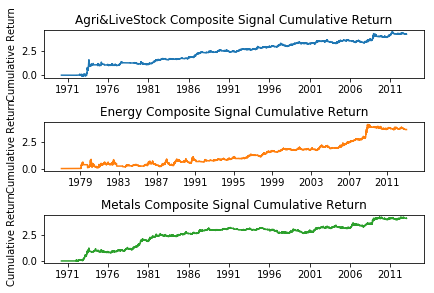

In [20]:
# Attributing signal performance into sectors 
# First calculate avg log returns for each commodity
# and combine columns by sector
combined_return['Agri&LiveStock'] = combined_return.iloc[:, 0:11].mean(1)
combined_return['Energy'] = combined_return.iloc[:, 11:17].mean(1)
combined_return['Metals'] = combined_return.iloc[:, 17:24].mean(1)

# Calculate cumulative performance of each sector
Agri_Composite = combined_return['Agri&LiveStock'].cumsum()
Energy_Composite = combined_return['Energy'].cumsum()
Metals_Composite = combined_return['Metals'].cumsum()

# Visualisation of the respective portfolios vs benchmark
plt.subplot(3, 1, 1)
plt.plot(Agri_Composite, color='C0')
plt.title('Agri&LiveStock Composite Signal Cumulative Return')
plt.ylabel('Cumulative Return')

plt.subplot(3, 1, 2)
plt.plot(Energy_Composite, color='C1')
plt.title('Energy Composite Signal Cumulative Return')
plt.ylabel('Cumulative Return')

plt.subplot(3, 1, 3)
plt.plot(Metals_Composite, color='C2')
plt.title('Metals Composite Signal Cumulative Return')
plt.ylabel('Cumulative Return')

plt.tight_layout()
plt.show()

In [21]:
def SR_ratio(returnmatrix):
    annual_return=returnmatrix.mean(axis=0)*261
    annual_vol=(returnmatrix.std())*math.sqrt(261)
    SR_ratio=annual_return/annual_vol
    return SR_ratio



In [22]:
# Calculate sharpe ration for each portfolio, eg: combined strategy
SR_ratio(combined_port_ret)

0.7925373551812145

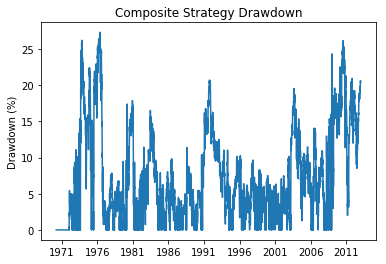

In [23]:
combined_cum_price=np.exp(combined_cum_ret)
Drawdown= combined_cum_price.cummax() - combined_cum_price # get all Drawdowns: diffs between cumulative max price and curent price
DD = (Drawdown / combined_cum_price.cummax())*100 #for %
plt.plot(DD, color='C0')
plt.title('Composite Strategy Drawdown')
plt.ylabel('Drawdown (%)')
plt.show()

In [26]:
#Calculating Prices of the strategy assuming initial price is one
#log-scale return 
def performance(cum_return, port_return,lable):
    cum_price=np.exp(cum_return)
    simple_return=np.exp(port_return)-1
    stats = pd.DataFrame(index=[lable])
    lastIndex            = cum_price.shape[0] - 1              # need - 1 since array referencing starts from 0
    stats['Tot Ret']  = cum_return[lastIndex] # (prices[ prices.shape[0]] / prices[0])-1 does same in 1 step
    stats['Avg Ret']     = port_return.mean()*261
    stats['Std']         = port_return.std()*np.sqrt(261)        # sigma*sqrt(T)
    stats['SR']          = stats['Avg Ret']/ stats['Std'] # Sharpe Ratio 
    stats['Skew']        = port_return.skew()        # For normal should be 0
    stats['Kurt']        = port_return.kurtosis()    # For normal should be 3
    
    HWM_time             = cum_price.argmax() # returns argument corresponding to max price (i.e. Timestamp, e.g. Timestamp('2018-01-26 00:00:00'))
    stats['HWM']         = cum_price.max()    # returns max price
    stats['HWM date']    = HWM_time.date() # converts Timestamp('2018-01-26 00:00:00') to datetime.date(2018, 1, 26) 
    DD                   = cum_price.cummax() - cum_price    # get all Drawdowns: diffs between cumulative max price and curent price
    end_mdd              = np.argmax(DD)               # get date of max Drawdown 
                                                       # maxDD = 888.6, argmax = Timestamp('2009-03-09 00:00:00')
    start_mdd            = np.argmax(cum_price[:end_mdd]) # get date of max price before trough ('2009-03-09 00:00:00')
                                                       # prices[:end_mdd] - prices from starting time to end_mdd Timestamp       
                                                       # maxPrice = 1565.15, argmax = Timestamp('2007-10-09 00:00:00')

# Maximum Drawdown as positive proportional loss from peak
    
    stats['MDD']         = 1 - cum_price[end_mdd]/cum_price[start_mdd] # (same as P_start - P_end) / P_start
    stats['Peak date']   = start_mdd.date()
    stats['Trough date'] = end_mdd.date()
    
    bool_P               = cum_price[end_mdd:] > cum_price[start_mdd] # True/False current price > price of DD peak
    stats['Rec date']    = bool_P.argmax().date() # date of first True occurrence, i.e. first time price goes 
                                                  # over price of DD peak# (Date the asset recovered from Drawdown loss)               
    stats['MDD dur']     = (stats['Rec date'] - stats['Peak date'])[0].days   # MDD duration in days from peak to recovery date
    return stats.T

In [27]:
performance(combined_cum_ret,combined_port_ret,"Composite Strategy Return Performance")
performance(TSMOM_cum_ret_adj,TSMOM_Port_return," Simple TSMOM Portfolio Performance")
performance(Mkt_cum_ret_adj,mktportfolio_adj,"Market Portfolio Performance")

,Market Portfolio Performance
Tot Ret,0.345133
Avg Ret,0.00822046
Std,0.141316
SR,0.0581708
Skew,-0.237003
Kurt,3.50433
HWM,4.04786
HWM date,1974-11-08
MDD,0.760803
Peak date,1974-11-08


In [31]:
performance(Agri_Composite,combined_return['Agri&LiveStock'],"Agri&LiveStock Composite Performance")

,Agri&LiveStock Composite Performance
Tot Ret,4.26317
Avg Ret,0.0996764
Std,0.198842
SR,0.501284
Skew,0.150423
Kurt,15.4992
HWM,88.6588
HWM date,2011-03-07
MDD,0.324058
Peak date,2008-12-05


In [32]:
performance(Energy_Composite,combined_return['Energy'],"Energy Composite Performance")

,Energy Composite Performance
Tot Ret,3.67304
Avg Ret,0.102137
Std,0.272522
SR,0.374787
Skew,-0.0991071
Kurt,12.8131
HWM,64.1277
HWM date,2008-12-24
MDD,0.391038
Peak date,2008-12-24


In [30]:
performance(Metals_Composite,combined_return['Metals'],"Metals Composite Performance")

,Composite Strategy Return Performance
Tot Ret,4.11441
Avg Ret,0.0961982
Std,0.179026
SR,0.537343
Skew,-0.0561489
Kurt,7.40204
HWM,71.7606
HWM date,2009-09-03
MDD,0.249376
Peak date,2009-09-03
